# DL Engima 1.0

In [1]:
!pip install ultralytics>=8.3.0
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:


import os
import numpy as np
import pandas as pd
from tqdm import tqdm

In [4]:


!rm -rf *

# make directory ...

!mkdir /kaggle/working/datasets
!mkdir /kaggle/working/datasets/badodd
!mkdir /kaggle/working/datasets/badodd/labels
!mkdir /kaggle/working/datasets/badodd/labels/train
!mkdir /kaggle/working/datasets/badodd/images
!mkdir /kaggle/working/datasets/badodd/images/train
!mkdir /kaggle/working/datasets/badodd/images/test

In [5]:
#  reference original files without duplicating their content ...

def all_files_in_folder_symlink(source_dir, target_dir):
    files = os.listdir(source_dir)
    
    for file in tqdm(files):
        source_file = os.path.join(source_dir, file)
        target_file = os.path.join(target_dir, file)
        os.symlink(source_file, target_file)

In [6]:
# symbolic link function as above ...

all_files_in_folder_symlink("/kaggle/input/dl-enigma-10-sust-cse-carnival-2024/dlenigma1/BadODD/labels/train","/kaggle/working/datasets/badodd/labels/train")
all_files_in_folder_symlink("/kaggle/input/dl-enigma-10-sust-cse-carnival-2024/dlenigma1/BadODD/images/train","/kaggle/working/datasets/badodd/images/train")
all_files_in_folder_symlink("/kaggle/input/dl-enigma-10-sust-cse-carnival-2024/dlenigma1/BadODD/images/test","/kaggle/working/datasets/badodd/images/test")

100%|██████████| 1964/1964 [00:00<00:00, 35417.49it/s]


# Visualizing the inference

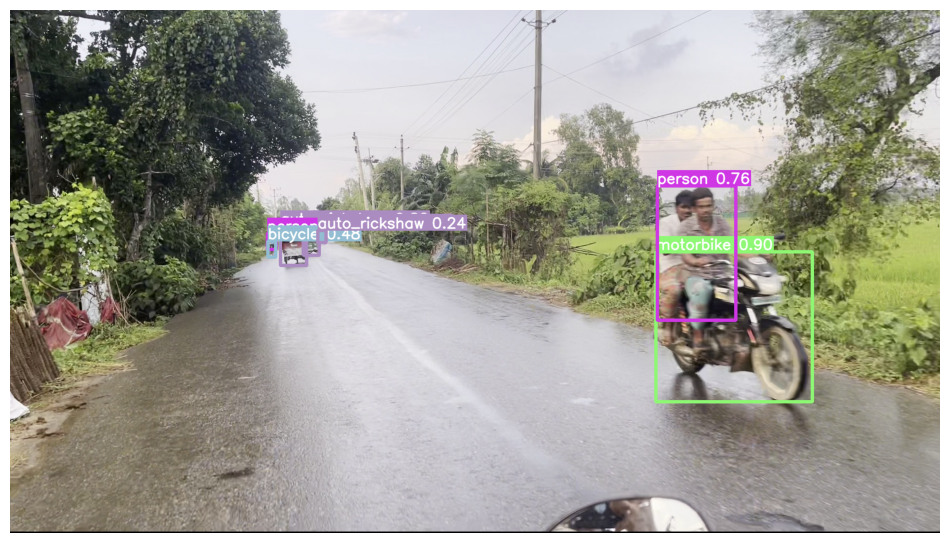

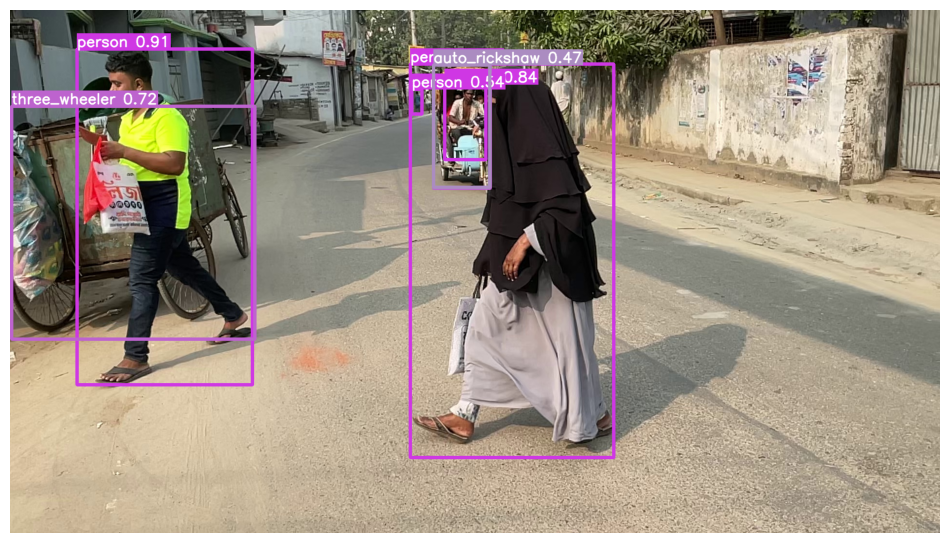

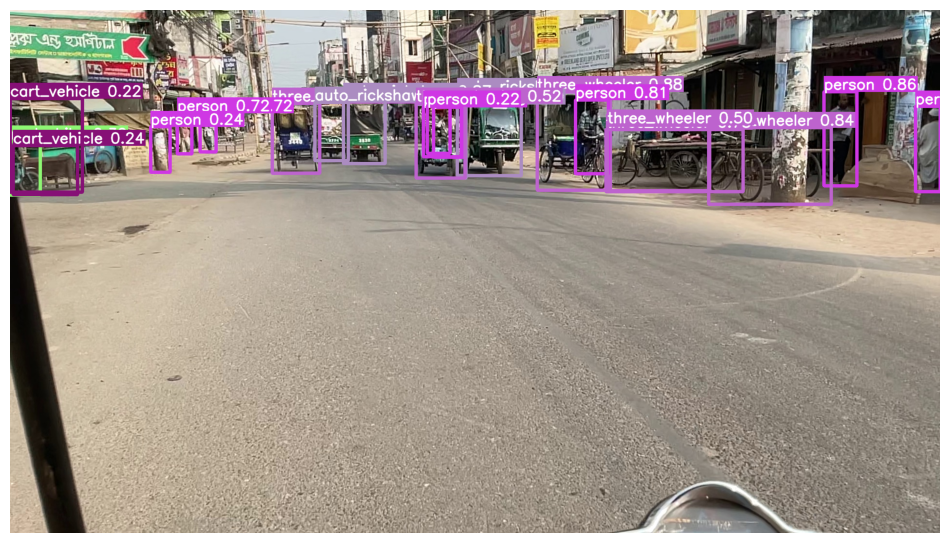

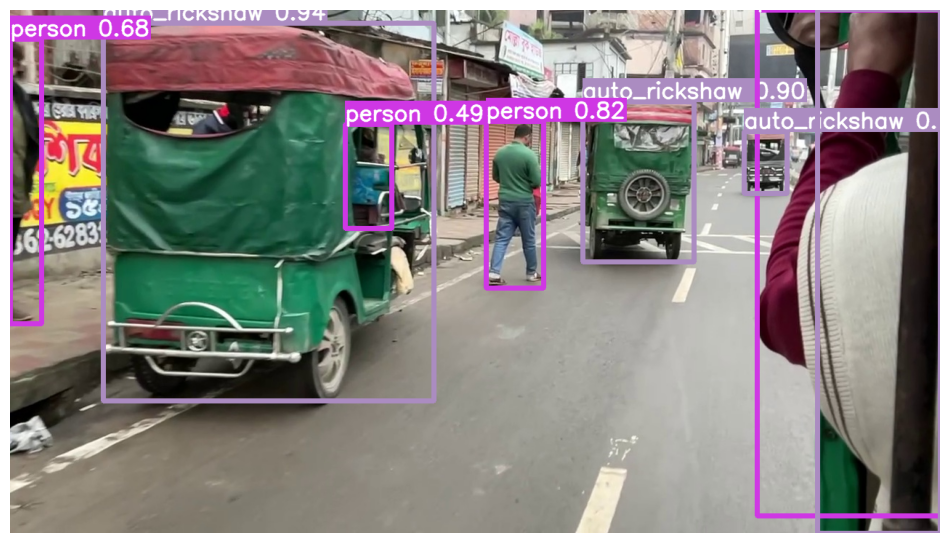

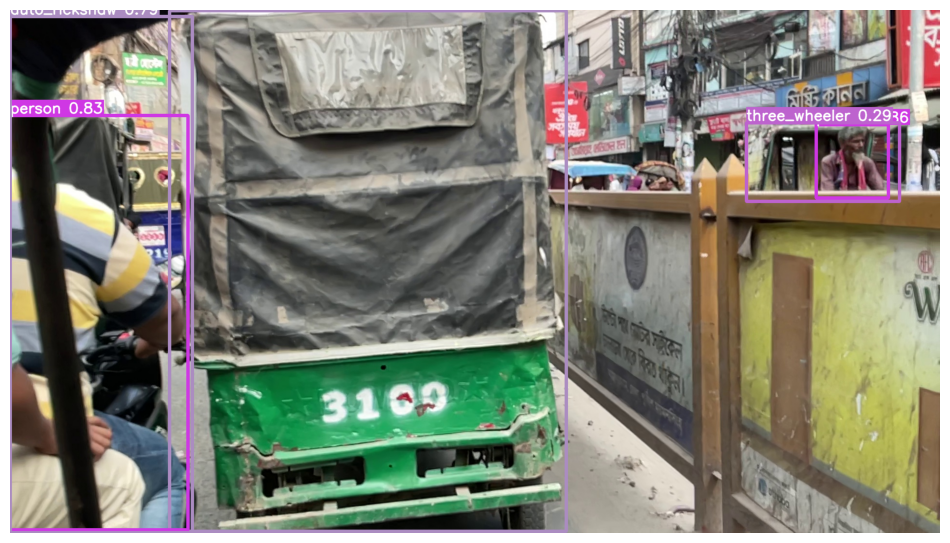

...

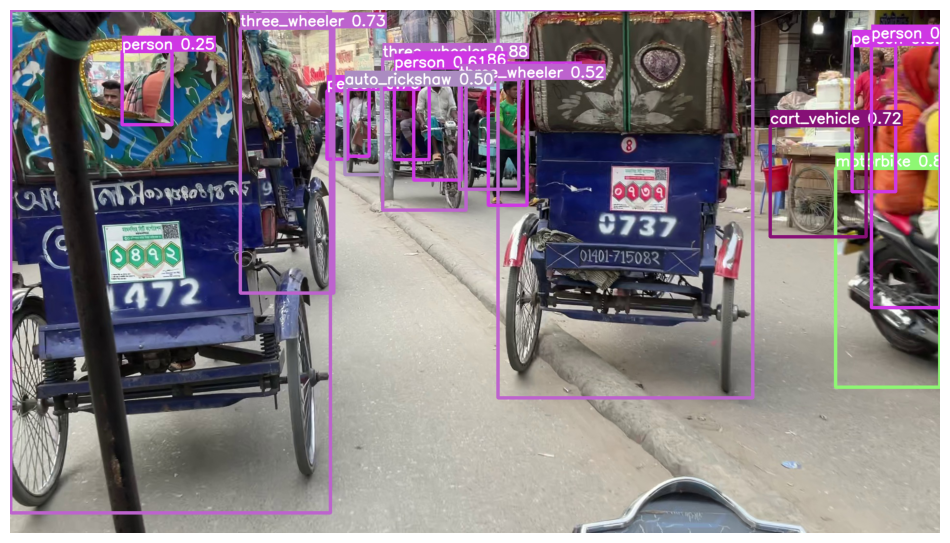

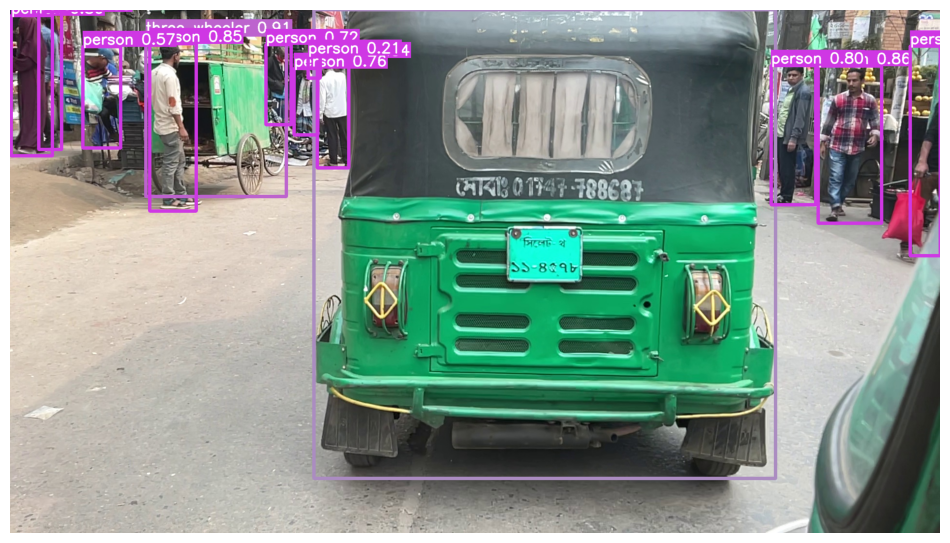

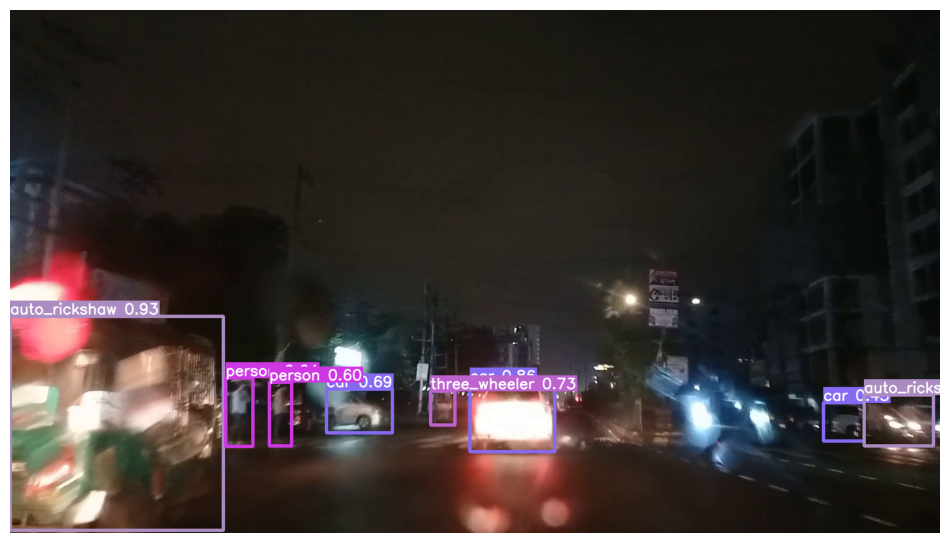

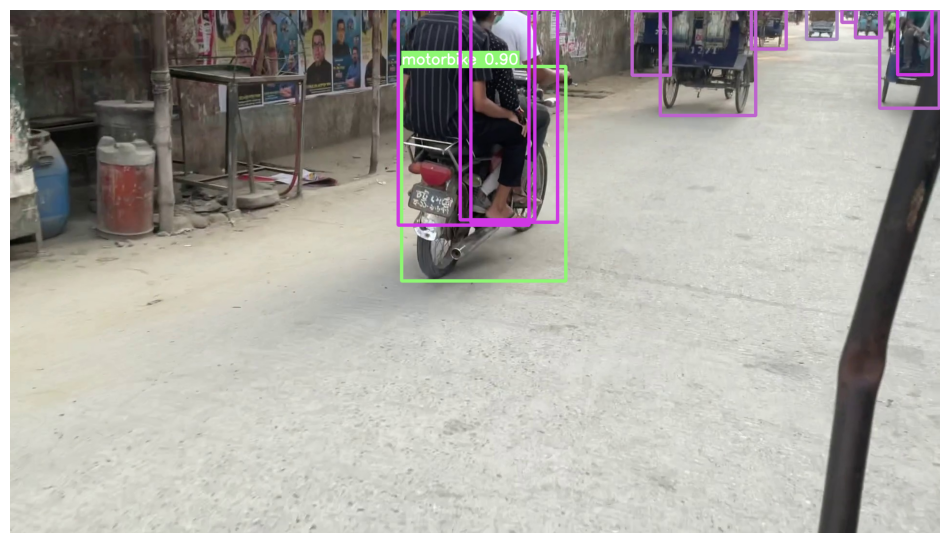

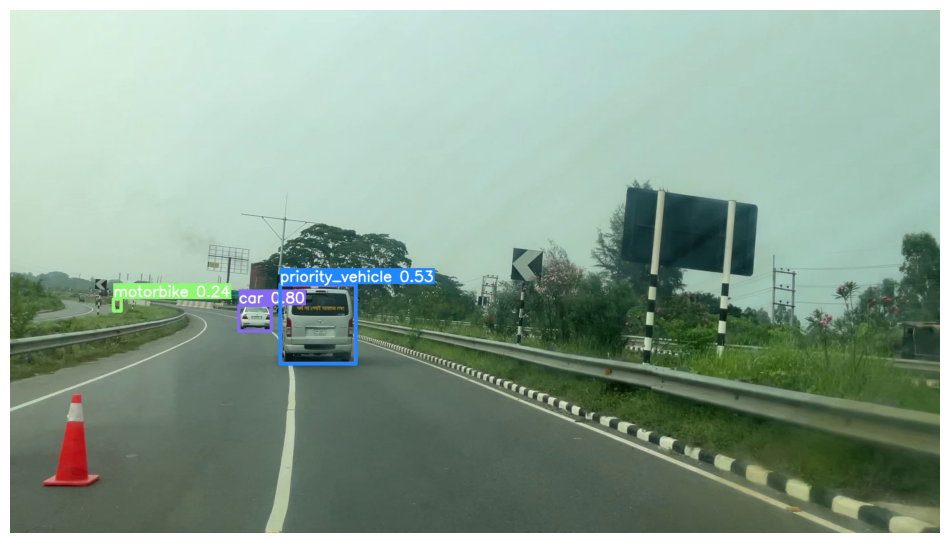

In [17]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO


model = YOLO('/kaggle/input/best-model-for-inference/best (1).pt')

test_directory = "/kaggle/input/dl-enigma-10-sust-cse-carnival-2024/dlenigma1/BadODD/images/test"

import numpy as np

# make a distinct color for each class
colors = {i: tuple(np.random.randint(0, 255, 3).tolist()) for i in range(len(model.names))}

import numpy as np

# Generate fixed colors per class
colors = {i: tuple(np.random.randint(0, 255, 3).tolist()) for i in range(len(model.names))}

def visualize_image(image_path, boxes, scores, classes, names):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = map(int, box)
        cls_id = int(classes[i])
        color = colors.get(cls_id, (255, 0, 0))
        label = f"{names[cls_id]} {scores[i]:.2f}" if names else f"{cls_id}:{scores[i]:.2f}"

        # === Thicker bounding box ===
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness=6)

        # === Larger colored label box ===
        (tw, th), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 1, 2)  # scale=1, thickness=2
        cv2.rectangle(img, (x1, y1 - th - 10), (x1 + tw, y1), color, -1)  # filled rectangle

        # === White text on top of colored rectangle ===
        cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                    1, (255, 255, 255), 2, cv2.LINE_AA)
    
    plt.figure(figsize=(12, 8))  # make image display larger
    plt.imshow(img)
    plt.axis('off')
    plt.show()



for i, filename in enumerate(os.listdir(test_directory)):
    if filename.endswith(".jpg") and i < 20:
        path = os.path.join(test_directory, filename)
        result = model.predict(source=path, conf=0.2, verbose=False)
        boxes = result[0].boxes.xyxy.cpu().numpy()   # <-- use xyxy (pixels)
        scores = result[0].boxes.conf.cpu().numpy()
        classes = result[0].boxes.cls.cpu().numpy()
        visualize_image(path, boxes, scores, classes, model.names)

